# Mid-Term Project

### Rebecca Jenkins
On my honor, as a student, I have neither given nor received unauthorized aid on this academic work.

- To describe the American movie industry as an "enormous" and "multi-billion dollar" entity is trifling.  Film studios produce and release hundreds of movies annually, often earning several million dollars in revenue for a single film.  However, despite the profit to be made in the movie industry, it is important to make strategic decisions that will increase the likelihood of its success.  After all, millions of dollars go into production.  Being able to identify what characteristics make a movie successful is an incredibly important feat for producers and directors - but it is equally as challenging.  
- The goal of this project is to identify the variables that will most accurately predict what makes a movie successful.  We want to be able to advise producers and directors during their decision-making about what genre to pursue, the upper limits of their budget, how long the production should run, etc.
- Before we analyze the information contained within our dataset, I hypothesize the following variables will have at least a weak positive correlation with a movie's IMDB score: 
    - Facebook likes
    - Content rating
    - Number of critic reviews
    - Genre

## Data Understanding

In [1]:
import pandas as pd
import numpy as np
from sklearn.metrics import multilabel_confusion_matrix
from scipy import stats
from pandas.plotting import scatter_matrix
import pingouin as pg
import statsmodels.api as sm
from statsmodels.formula.api import ols
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
import chart_studio.plotly as py
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
import warnings; warnings.simplefilter('ignore')

In [3]:
df = pd.read_csv("movie_metadata.csv")
df = df[sorted(df.columns)];

In [4]:
df.head()

,actor_1_facebook_likes,actor_1_name,actor_2_facebook_likes,actor_2_name,actor_3_facebook_likes,actor_3_name,aspect_ratio,budget,cast_total_facebook_likes,color,...,imdb_score,language,movie_facebook_likes,movie_imdb_link,movie_title,num_critic_for_reviews,num_user_for_reviews,num_voted_users,plot_keywords,title_year
0,1000.0,CCH Pounder,936.0,Joel David Moore,855.0,Wes Studi,1.78,237000000.0,4834,Color,...,7.9,English,33000,http://www.imdb.com/title/tt0499549/?ref_=fn_t...,Avatar,723.0,3054.0,886204,avatar|future|marine|native|paraplegic,2009.0
1,40000.0,Johnny Depp,5000.0,Orlando Bloom,1000.0,Jack Davenport,2.35,300000000.0,48350,Color,...,7.1,English,0,http://www.imdb.com/title/tt0449088/?ref_=fn_t...,Pirates of the Caribbean: At World's End,302.0,1238.0,471220,goddess|marriage ceremony|marriage proposal|pi...,2007.0
2,11000.0,Christoph Waltz,393.0,Rory Kinnear,161.0,Stephanie Sigman,2.35,245000000.0,11700,Color,...,6.8,English,85000,http://www.imdb.com/title/tt2379713/?ref_=fn_t...,Spectre,602.0,994.0,275868,bomb|espionage|sequel|spy|terrorist,2015.0
3,27000.0,Tom Hardy,23000.0,Christian Bale,23000.0,Joseph Gordon-Levitt,2.35,250000000.0,106759,Color,...,8.5,English,164000,http://www.imdb.com/title/tt1345836/?ref_=fn_t...,The Dark Knight Rises,813.0,2701.0,1144337,deception|imprisonment|lawlessness|police offi...,2012.0
4,131.0,Doug Walker,12.0,Rob Walker,NaN,NaN,NaN,NaN,143,NaN,...,7.1,NaN,0,http://www.imdb.com/title/tt5289954/?ref_=fn_t...,Star Wars: Episode VII - The Force Awakens ...,NaN,NaN,8,NaN,NaN


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5043 entries, 0 to 5042
Data columns (total 28 columns):
actor_1_facebook_likes       5036 non-null float64
actor_1_name                 5036 non-null object
actor_2_facebook_likes       5030 non-null float64
actor_2_name                 5030 non-null object
actor_3_facebook_likes       5020 non-null float64
actor_3_name                 5020 non-null object
aspect_ratio                 4714 non-null float64
budget                       4551 non-null float64
cast_total_facebook_likes    5043 non-null int64
color                        5024 non-null object
content_rating               4740 non-null object
country                      5038 non-null object
director_facebook_likes      4939 non-null float64
director_name                4939 non-null object
duration                     5028 non-null float64
facenumber_in_poster         5030 non-null float64
genres                       5043 non-null object
gross                        4159 no

We can see from the information printed above that *movie_metadata.csv* contains 28 separate columns of data.  There is a maximum of 5043 entries per column, although it appears 22 columns are missing information in several rows.  This can be addressed during data preparation, before we visualize and analyze what this dataset can communicate.  It is worth noting the most common datatype is float64, followed by object.  We will determine later in our analysis if any of these categorical columns need represented numerically.

In [6]:
df.describe()

,actor_1_facebook_likes,actor_2_facebook_likes,actor_3_facebook_likes,aspect_ratio,budget,cast_total_facebook_likes,director_facebook_likes,duration,facenumber_in_poster,gross,imdb_score,movie_facebook_likes,num_critic_for_reviews,num_user_for_reviews,num_voted_users,title_year
count,5036.000000,5030.000000,5020.000000,4714.000000,4.551000e+03,5043.000000,4939.000000,5028.000000,5030.000000,4.159000e+03,5043.000000,5043.000000,4993.000000,5022.000000,5.043000e+03,4935.000000
mean,6560.047061,1651.754473,645.009761,2.220403,3.975262e+07,9699.063851,686.509212,107.201074,1.371173,4.846841e+07,6.442138,7525.964505,140.194272,272.770808,8.366816e+04,2002.470517
std,15020.759120,4042.438863,1665.041728,1.385113,2.061149e+08,18163.799124,2813.328607,25.197441,2.013576,6.845299e+07,1.125116,19320.445110,121.601675,377.982886,1.384853e+05,12.474599
min,0.000000,0.000000,0.000000,1.180000,2.180000e+02,0.000000,0.000000,7.000000,0.000000,1.620000e+02,1.600000,0.000000,1.000000,1.000000,5.000000e+00,1916.000000
25%,614.000000,281.000000,133.000000,1.850000,6.000000e+06,1411.000000,7.000000,93.000000,0.000000,5.340988e+06,5.800000,0.000000,50.000000,65.000000,8.593500e+03,1999.000000
50%,988.000000,595.000000,371.500000,2.350000,2.000000e+07,3090.000000,49.000000,103.000000,1.000000,2.551750e+07,6.600000,166.000000,110.000000,156.000000,3.435900e+04,2005.000000
75%,11000.000000,918.000000,636.000000,2.350000,4.500000e+07,13756.500000,194.500000,118.000000,2.000000,6.230944e+07,7.200000,3000.000000,195.000000,326.000000,9.630900e+04,2011.000000
max,640000.000000,137000.000000,23000.000000,16.000000,1.221550e+10,656730.000000,23000.000000,511.000000,43.000000,7.605058e+08,9.500000,349000.000000,813.000000,5060.000000,1.689764e+06,2016.000000


There are several important observations we can make using the data description above:  
- This dataset contains movies released between the years 1916 and 2016, the average having been released in 2002.
- There are incredibly large discrepancies in data collected on public influence.  Meaning, some actors and movies have zero Facebook likes while others have 640,000+ likes.
    - These discrepancies are further illustrated by the distance between a column's mean value and its maximum value.  For example, the *movie_facebook_likes* column has an average of 7,252 likes and a maximum of 349,000 likes.
- Additionally, there is a huge difference between the dataset's minimum value for the number of user votes (5) and the maximum value (1,689,764).

## Data Preparation
###  Resolving Missing Values

In [7]:
df.isnull().sum()

actor_1_facebook_likes         7
actor_1_name                   7
actor_2_facebook_likes        13
actor_2_name                  13
actor_3_facebook_likes        23
actor_3_name                  23
aspect_ratio                 329
budget                       492
cast_total_facebook_likes      0
color                         19
content_rating               303
country                        5
director_facebook_likes      104
director_name                104
duration                      15
facenumber_in_poster          13
genres                         0
gross                        884
imdb_score                     0
language                      12
movie_facebook_likes           0
movie_imdb_link                0
movie_title                    0
num_critic_for_reviews        50
num_user_for_reviews          21
num_voted_users                0
plot_keywords                153
title_year                   108
dtype: int64

Given the significant number of missing values in both *gross* and *budget* columns, but their indisputable relevance in assessing this dataset, I have decided to remove all rows containing missing values.  Additionally, I decided to remove the rows with missing values in the *content_rating* column, because accurately guessing a particular movie's rating based on quantitative values, as a categorical variable, would be improbable.

In [8]:
df = df.dropna(subset=['gross', 'budget', 'content_rating'])

In [9]:
df = df.drop_duplicates()

In [10]:
df = df.replace({0 : np.nan, '' : np.nan})

In [11]:
df.isnull().sum()

actor_1_facebook_likes          5
actor_1_name                    1
actor_2_facebook_likes         18
actor_2_name                    2
actor_3_facebook_likes         36
actor_3_name                    6
aspect_ratio                   55
budget                          0
cast_total_facebook_likes       5
color                           2
content_rating                  0
country                         0
director_facebook_likes       657
director_name                   0
duration                        0
facenumber_in_poster         1608
genres                          0
gross                           0
imdb_score                      0
language                        2
movie_facebook_likes         1752
movie_imdb_link                 0
movie_title                     0
num_critic_for_reviews          1
num_user_for_reviews            0
num_voted_users                 0
plot_keywords                  21
title_year                      0
dtype: int64

### Removing Unnecessary Columns

In [12]:
df['language'].value_counts().head()

English     3644
French        34
Spanish       24
Mandarin      14
German        11
Name: language, dtype: int64

Given the extreme disparity between values in the *language* column, I decided to remove this column entirely.

In [13]:
df = df.drop(columns=['language']);

I decided to drop the columns *aspect_ratio* and *movie_imdb_link* because neither seemed particularly relevant to what we are analyzing in this dataset.  It is especially considering the *movie_imdb_link* was nothing more than a route to another webpage, removing these two columns makes our dataset cleaner and easier to interpret.  Additionally, I dropped the *color* column because black and white film comprises such a minimal amount of the data.

In [14]:
df = df.drop(columns=['aspect_ratio', 'movie_imdb_link', 'color']);

I have decided to drop all columns relating to actors and their respective Facebook likes.  We are all familiar with movies starring wildly famous actors that have bombed at the box office.  Additionally, since there are potentially three times as actors as there are movies within this dataset, I determined there would not be a large enough sample size to compare movie success with specific actors.

In [15]:
df = df.drop(columns=['actor_1_name', 'actor_2_name', 'actor_3_name'])

In [16]:
df = df.drop(columns=['actor_1_facebook_likes', 'actor_2_facebook_likes', 'actor_3_facebook_likes'])

### Considering Datatypes
There are multiple variables presented as the float64 datatype when, as an integer, mathematical and statistical evaluation may be simplified.  I decided to convert all variables regarding Facebook likes, counts of users and critics, title years, and face numbers into integers.  These are discrete quantities that have no decimal value.

In [17]:
df['title_year'] = df['title_year'].astype(int)

In [18]:
df['num_voted_users'] = df['num_voted_users'].astype(int)
df['num_user_for_reviews'] = df['num_user_for_reviews'].fillna(0.0).astype(int)
df['num_critic_for_reviews'] = df['num_critic_for_reviews'].fillna(0.0).astype(int)

In [19]:
df['movie_facebook_likes'] = df['movie_facebook_likes'].fillna(0.0).astype(int)
df['director_facebook_likes'] = df['director_facebook_likes'].fillna(0.0).astype(int)
df['cast_total_facebook_likes'] = df['cast_total_facebook_likes'].fillna(0.0).astype(int)

In [20]:
df['facenumber_in_poster'] = df['facenumber_in_poster'].fillna(0.0).astype(int)

In [21]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3806 entries, 0 to 5042
Data columns (total 18 columns):
budget                       3806 non-null float64
cast_total_facebook_likes    3806 non-null int32
content_rating               3806 non-null object
country                      3806 non-null object
director_facebook_likes      3806 non-null int32
director_name                3806 non-null object
duration                     3806 non-null float64
facenumber_in_poster         3806 non-null int32
genres                       3806 non-null object
gross                        3806 non-null float64
imdb_score                   3806 non-null float64
movie_facebook_likes         3806 non-null int32
movie_title                  3806 non-null object
num_critic_for_reviews       3806 non-null int32
num_user_for_reviews         3806 non-null int32
num_voted_users              3806 non-null int32
plot_keywords                3785 non-null object
title_year                   3806 non-null int

### Addressing Inconsistent Values

In [22]:
df['content_rating'].value_counts()

R            1723
PG-13        1314
PG            573
G              91
Not Rated      42
Unrated        24
Approved       17
X              10
NC-17           6
Passed          3
M               2
GP              1
Name: content_rating, dtype: int64

Brief research on the history of movie content rating scales, I learned there are synonymous ratings within this dataset that I will consolidate.  Additionally, "Passed" and "Approved" were used before an official system was established, and comprise very little of this dataset, so I have decided to drop the rows containing those values.

In [23]:
df = df.replace({'M' : 'PG', 'GP' : 'PG', 'X' : 'NC-17'})

In [24]:
df = df.drop(df.loc[df['content_rating'] == 'Passed'].index);

In [25]:
df.drop(df.loc[df['content_rating'] == 'Approved'].index, inplace=True);

In [26]:
df['content_rating'].value_counts()

R            1723
PG-13        1314
PG            576
G              91
Not Rated      42
Unrated        24
NC-17          16
Name: content_rating, dtype: int64

## Business Intelligence

In [27]:
df.sort_values('imdb_score', ascending=False).head(5)

,budget,cast_total_facebook_likes,content_rating,country,director_facebook_likes,director_name,duration,facenumber_in_poster,genres,gross,imdb_score,movie_facebook_likes,movie_title,num_critic_for_reviews,num_user_for_reviews,num_voted_users,plot_keywords,title_year
1937,25000000.0,13495,R,USA,0,Frank Darabont,142.0,0,Crime|Drama,28341469.0,9.3,108000,The Shawshank Redemption,199,4144,1689764,escape from prison|first person narration|pris...,1994
3466,6000000.0,28122,R,USA,0,Francis Ford Coppola,175.0,1,Crime|Drama,134821952.0,9.2,43000,The Godfather,208,2238,1155770,crime family|mafia|organized crime|patriarch|r...,1972
2837,13000000.0,39960,R,USA,0,Francis Ford Coppola,220.0,1,Crime|Drama,57300000.0,9.0,14000,The Godfather: Part II,149,650,790926,1950s|corrupt politician|lake tahoe nevada|mel...,1974
66,185000000.0,57802,PG-13,USA,22000,Christopher Nolan,152.0,0,Action|Crime|Drama|Thriller,533316061.0,9.0,37000,The Dark Knight,645,4667,1676169,based on comic book|dc comics|psychopath|star ...,2008
3355,8000000.0,16557,R,USA,16000,Quentin Tarantino,178.0,1,Crime|Drama,107930000.0,8.9,45000,Pulp Fiction,215,2195,1324680,black comedy|cunnilingus|neo noir|nonlinear ti...,1994


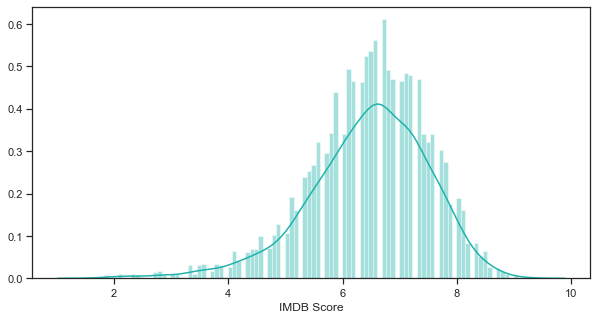

In [28]:
plt.figure(figsize=(10,5));
sns.distplot(df['imdb_score'], bins=100, color='lightseagreen');
plt.xlabel('IMDB Score');

The distribution of IMDB scores appears to fall into a normal distribution with a slight negative skew.  This was foreshadowed in the statistical summary above, given the mean value of *imbd_score* is 6.46.  A perfectly symmetrical normal distribution would have a mean of 5.0.

#### *Duration*

In [29]:
df['duration'].mean()

109.93343898573693

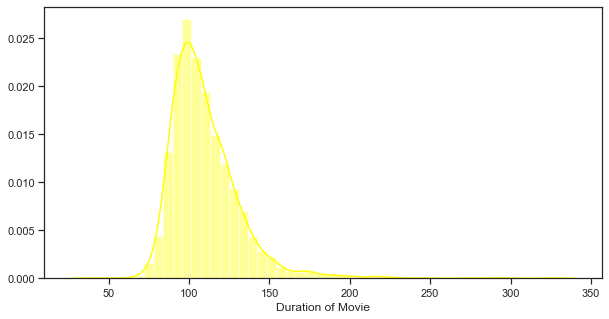

In [30]:
plt.figure(figsize=(10,5));
sns.distplot(df['duration'], bins=50, color='yellow');
plt.xlabel('Duration of Movie');

The mean calculation and graph illustrated above tells us, of the movies included in this dataset, the average duration was 109 minutes.  The distribution of duration appears somewhat normal with a slight positive skew, but we will look into this further during our correlation analyses.  

In [31]:
px.scatter(df, x='duration', y='gross', color='imdb_score',
                color_continuous_scale=px.colors.sequential.Viridis, render_mode="webgl",
                labels={'duration':'Duration of Movie', 'gross' : 'Gross Profit'},
                width=600, height=500, trendline='ols')

The visualization above indicates a positive relationship between duration and gross profit of a movie.  Higher gross profit is not synonymous with a highly-rated movie, but we can see the points outside of the cluster (higher gross profit or longer duration) tend to be of higher IMDB rating.  The large data cluster is highly concentrated, and therefore distinctions between points is difficult, but the darker colors (lower IMDB score) seem to yield lower gross profits and be of shorter duration.

#### *Year of Release*

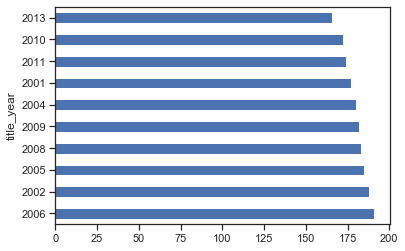

In [32]:
df.groupby('title_year').size().sort_values(ascending=False).head(10).plot(kind='barh');

We can determine from this horizontal bar graph that in 2006, the highest number of movies were released.  Although this is interesting information, I have decided not to pursue the correlation between title year and IMDB score further.  It is not surprisingly to see higher counts of releases in the previous few decades, as the film industry has only grown with the advancement of technology.

#### *Genre*

In [33]:
genre = df[['genres','imdb_score']];

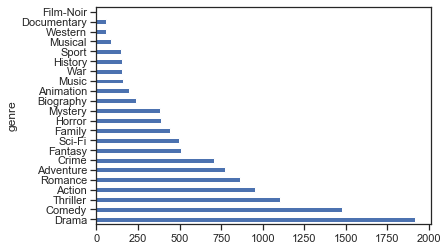

In [34]:
x = pd.DataFrame(genre.genres.str.split('|').tolist(), index=genre.imdb_score).stack()
x = x.reset_index()[[0, 'imdb_score']] 
x.columns = ['genre', 'imdb_score'] 
x.groupby('genre')['imdb_score'].size().sort_values(ascending=False).plot(kind='barh');

Illustrated by the horizontal bar graph above, when grouped by the column *imdb_score*, drama is the most prominent value in the *genres* column.  There are extremely large disparities between the genres included in this dataset, with almost a 400 count difference between the leading genre (drama) and the second leading genre (comedy).  

#### *Facebook Likes*

In [35]:
px.scatter(df, x='movie_facebook_likes', y='gross', color='imdb_score',
                color_continuous_scale=px.colors.sequential.Viridis, render_mode='webgl',
                labels={'movie_facebook_likes':'Movie Facebook Likes', 'gross' : 'Gross Profit'},
                width=600, height=500, trendline='ols')

There is a positive correlation between Facebook likes for the movie and gross profit.  This isn't particularly surprising, because more Facebook activity generates more interest, and we can make the assumption that people who like the movie on Facebook also communicate with their friends, online and in real life, about it as well.

#### *Number of Voters and Critics*

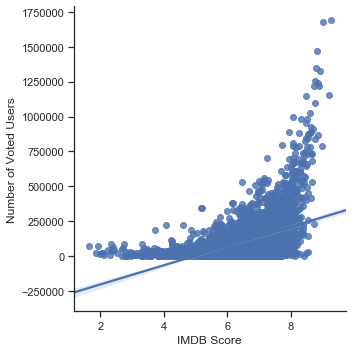

In [36]:
sns.lmplot('imdb_score', 'num_voted_users', df,
              x_jitter=.05, y_jitter=.05);
plt.xlabel('IMDB Score');
plt.ylabel('Number of Voted Users');

There is a positive correlation between IMDB score and number of voted users, as illustrated in this graph.  

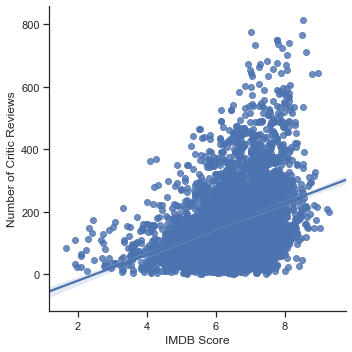

In [37]:
sns.lmplot('imdb_score', 'num_critic_for_reviews', df,
              x_jitter=.05, y_jitter=.05);
plt.xlabel('IMDB Score');
plt.ylabel('Number of Critic Reviews');

There is a positive correlation between IMDB score and number of critic reviews, as illustrated in this graph.  The slope on this trendline is steeper than the trendline in the previous graph (IMDB score vs number of voted users) and in the following graph (IMDB score vs number of user reviews).

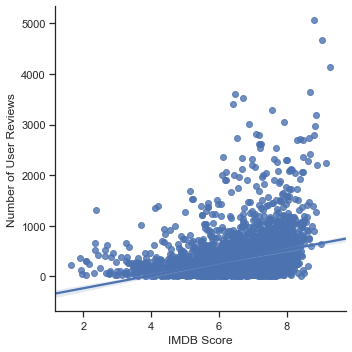

In [38]:
sns.lmplot('imdb_score', 'num_user_for_reviews', df,
              x_jitter=.05, y_jitter=.05);
plt.xlabel('IMDB Score');
plt.ylabel('Number of User Reviews');

There is a slight positive correlation between IMDB score and number of user reviews, as illustrated in this graph.  

#### *Number of Faces in Movie Poster*

In [39]:
px.scatter(df, x='facenumber_in_poster', y='imdb_score', color='imdb_score',
           color_continuous_scale=px.colors.sequential.Viridis, render_mode='webgl',
           labels={'facenumber_in_poster':'Number of Faces in Poster', 'imdb_score' : 'IMDB Score'}, 
           width=600, height=500, trendline='ols')

The trendline illustrated in the graph indicates a negative relationship between IMDB score and the number of faces in movie posters.  A heavy majority of movie posters display between zero and 10 faces, so showing less faces doesn't necessarily guarantee a higher rating.  

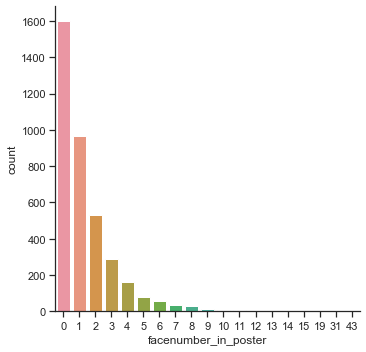

In [40]:
sns.factorplot('facenumber_in_poster', kind='count', data=df, size=5);

As we discussed above, most movie posters feature no more than ten faces, but this bar chart better illustrates the majority have zero people in the poster.  

#### *Content Rating*

In [41]:
df.groupby('content_rating')['num_voted_users'].size().sort_values(ascending=False).head()

content_rating
R            1723
PG-13        1314
PG            576
G              91
Not Rated      42
Name: num_voted_users, dtype: int64

In [42]:
px.histogram(df, x='num_critic_for_reviews', y='num_voted_users', color='content_rating',
             category_orders={'content_rating' : ['G' , 'PG', 'PG-13', 'R', 'NC-17']},
             labels={'num_critic_for_reviews':'Number of Critics', 'num_voted_users' : 'Number of Voted Users'},      
             width=600, height=500)

The groupby and histogram above show a majority of movies in this dataset have a content rating of "R" and "PG-13".

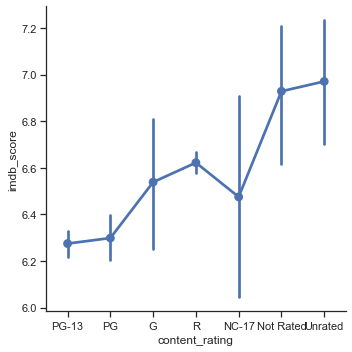

In [43]:
sns.catplot("content_rating", "imdb_score", data=df, kind='point');

It does not surprise me to see higher IMDB scores for rated "R" movies, as those typically attract older and more mature audiences.  However, I did not expected "Not Rated" and "Unrated" to generally be more successful.  That being said, it is important to note these two content ratings comprise very little of the whole dataset.

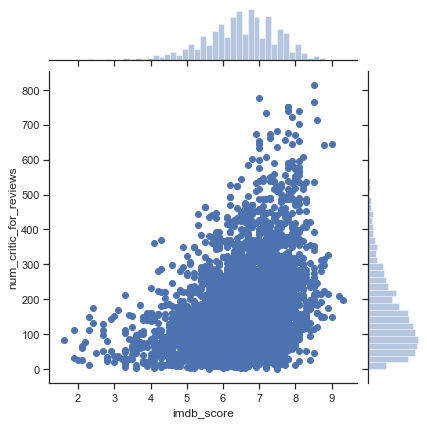

In [44]:
sns.jointplot('imdb_score', 'num_critic_for_reviews', df);

The jointplot shows what appears to be a relatively strong, positive relationship between the number of critic reviews and the movie rating.  

## Correlation Analysis

Let's look at the distribution of IMDB scores.

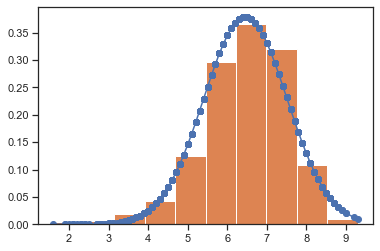

In [45]:
x = sorted(df['imdb_score'])
fit = stats.norm.pdf(x, np.mean(x), np.std(x))
plt.plot(x,fit,'-o');
plt.hist(x, density=True);  

As we discussed above during the **Business Intelligence** section, the distribution of IMDB scores appears to fall into a normal distribution with a slight negative skew.  The mean value of imdb_score is 6.46. A perfectly symmetrical normal distribution would have a mean of 5.0.  

In [46]:
pg.normality(df['imdb_score']).round(20)

,W,pval,normal
imdb_score,0.973094,0.0,False


This test confirms what we already discussed earlier.  The distribution of IMDB scores, although graphically appears close to normal, is not statistically considered in normal distribution.  Additionally, this is shown with a p-value < 0.05, because this value indicates a non-normally distributed dataset. 

Let's assess whether there is a statistically significant relationship between duration and a movie's IMDB score.  

In [47]:
mod = ols('imdb_score ~ duration', data=df).fit()
                
aov_table = sm.stats.anova_lm(mod, typ=2)
print(aov_table)

              sum_sq      df          F         PR(>F)
duration   570.32084     1.0  593.46004  6.874997e-122
Residual  3636.46061  3784.0        NaN            NaN


In [48]:
print(df[['duration', 'imdb_score']].corr())

            duration  imdb_score
duration    1.000000    0.368201
imdb_score  0.368201    1.000000


The p-value obtained from the ANOVA analysis between duration and IMDB score is significant.  Therefore, we can conclude there are some significant differences among rating in relation to how long the movie is.  Additionally, we can see the correlation between these two variables is 0.368 - this communicates a positive, somewhat strong relationship.  We can conclude the longer the movie, the more likely it is to receive a higher score.

I postulate this is because longer movies tend to have more complex, meaningful storylines and fleshed out characters.  Even though it can be a form of leisurely entertainment, people enjoy movies with plots to get invested in and characters to relate to.  It is difficult to achieve this with shorter duration.

In [49]:
mod = ols('imdb_score ~ movie_facebook_likes', data=df).fit()
                
aov_table = sm.stats.anova_lm(mod, typ=2)
print(aov_table)

                           sum_sq      df           F        PR(>F)
movie_facebook_likes   341.832903     1.0  334.673461  1.045496e-71
Residual              3864.948547  3784.0         NaN           NaN


In [50]:
print(df[['movie_facebook_likes', 'imdb_score']].corr())

                      movie_facebook_likes  imdb_score
movie_facebook_likes              1.000000    0.285057
imdb_score                        0.285057    1.000000


The p-value obtained from the ANOVA analysis between the movie's Facebook likes and IMDB score is significant.  Therefore, we can conclude there are some significant differences among rating in relation to how many likes the movie received on Facebook.  Additionally, we can see the correlation between these two variables is 0.285 - this communicates a weaker, but still positive, relationship.  We can conclude the more Facebook likes, the more likely it is to receive a higher score. 

Based off this information, I make the assumption that people who like movie pages on Facebook are more apt to discuss them with friends, online or in real life, and word-of-mouth is a very effective means of transmitting information.  The more attention something receives on social media, the more likely it is to get noticed and entice people to watch the movie themselves.

In [51]:
mod = ols('imdb_score ~ num_voted_users', data=df).fit()
                
aov_table = sm.stats.anova_lm(mod, typ=2)
print(aov_table)

                      sum_sq      df            F         PR(>F)
num_voted_users   968.943108     1.0  1132.385355  2.093337e-217
Residual         3237.838342  3784.0          NaN            NaN


In [52]:
print(df[['num_voted_users', 'imdb_score']].corr())

                 num_voted_users  imdb_score
num_voted_users         1.000000    0.479926
imdb_score              0.479926    1.000000


The p-value obtained from the ANOVA analysis between the number of users who voted and IMDB score is significant.  Therefore, we can conclude there are some significant differences among rating in relation to how many users cast a vote.  Additionally, we can see the correlation between these two variables is 0.480.  This is the strongest correlation we've encountered yet.  I interpret this to mean that the number of user voters has a very meaningful impact on predicting the rating of a movie.

To me, this correlation makes sense.  As I postulated before about the relationship between Facebook likes and ratings, having more users who voted implies more viewers.  The mean IMDB rating of 6.46 indicates the reviews are generally more positive than negative, and having a higher number of votes dilutes strongly negative, low scores.  

In [53]:
mod = ols('imdb_score ~ num_critic_for_reviews', data=df).fit()
                
aov_table = sm.stats.anova_lm(mod, typ=2)
print(aov_table)

                             sum_sq      df          F         PR(>F)
num_critic_for_reviews   521.522183     1.0  535.49555  6.452182e-111
Residual                3685.259267  3784.0        NaN            NaN


In [54]:
print(df[['num_critic_for_reviews', 'imdb_score']].corr())

                        num_critic_for_reviews  imdb_score
num_critic_for_reviews                1.000000    0.352096
imdb_score                            0.352096    1.000000


The p-value obtained from the ANOVA analysis between the number of critic reviews and IMDB score is significant.  Therefore, we can conclude there are some significant differences among rating in relation to how many critics reviewed the movie.  Additionally, we can see the correlation between these two variables is 0.352.  This is lower than the correlation we saw between score and number of user votes, but it is still indicative of a positive association.  As we discussed earlier, more reviews dilutes any particularly polarizing responses, meaning the final result is more likely a genuine reflection of the people's opinions.

In [55]:
mod = ols('imdb_score ~ gross', data=df).fit()
                
aov_table = sm.stats.anova_lm(mod, typ=2)
print(aov_table)

               sum_sq      df           F        PR(>F)
gross      199.839348     1.0  188.720494  6.043898e-42
Residual  4006.942102  3784.0         NaN           NaN


In [56]:
print(df[['gross', 'imdb_score']].corr())

               gross  imdb_score
gross       1.000000    0.217954
imdb_score  0.217954    1.000000


The p-value obtained from the ANOVA analysis between gross profit and IMDB score is significant.  Therefore, we can conclude there are some significant differences among rating in relation to how many critics reviewed the movie.  Additionally, we can see the correlation between these two variables is 0.218.  This is not a particularly strong correlation, but it is positive nonetheless.  

In [57]:
mod = ols('imdb_score ~ budget', data=df).fit()
                
aov_table = sm.stats.anova_lm(mod, typ=2)
print(aov_table)

               sum_sq      df         F    PR(>F)
budget       4.159831     1.0  3.745472  0.053025
Residual  4202.621619  3784.0       NaN       NaN


In [58]:
print(df[['budget', 'imdb_score']].corr())

              budget  imdb_score
budget      1.000000    0.031446
imdb_score  0.031446    1.000000


The p-value obtained from the ANOVA analysis between movie budget and IMDB score is not significant.  Therefore, we can conclude there is not a significant correlation between these two variables.  

Although I was somewhat surprised at first, this lack of correlation makes sense.  There are many movies included in this dataset and others we've watched ourselves that had an enormous production budget but still managed to fail our expectations.  Investing a lot of money doesn't guarantee it is a healthy investment that will produce returns, or in this case, high scores.

In [59]:
mod = ols('imdb_score ~ facenumber_in_poster', data=df).fit()
                
aov_table = sm.stats.anova_lm(mod, typ=2)
print(aov_table)

                           sum_sq      df          F    PR(>F)
facenumber_in_poster    20.662233     1.0  18.677416  0.000016
Residual              4186.119217  3784.0        NaN       NaN


In [60]:
print(df[['budget', 'facenumber_in_poster']].corr())

                        budget  facenumber_in_poster
budget                1.000000             -0.021864
facenumber_in_poster -0.021864              1.000000


The p-value obtained from the ANOVA analysis between the number of faces in the movie poster and IMDB score is significant.  Therefore, we can conclude there are some significant differences among rating in relation to how many faces are featured in promotional posters - but it is worth noting is it not as significant as other variables we have tested.  Additionally, we can see the correlation between these two variables is -0.0219.  This is a very weak negative correlation, but we did visualize earlier an inverted relationship between these characteristics.

I propose the very slight negative relationship between these variables is due to a societal shift in preferred aesthetic.  In recent years, popular design has become less "attention-grabbing" and "outgoing" and evolved into something more minimalistic.  Even though colors and exciting images certainly grab the attention of potential viewers, some people prefer more stylized advertisements.  Judging a book by its cover, after all, is something we are all sometimes guily of.

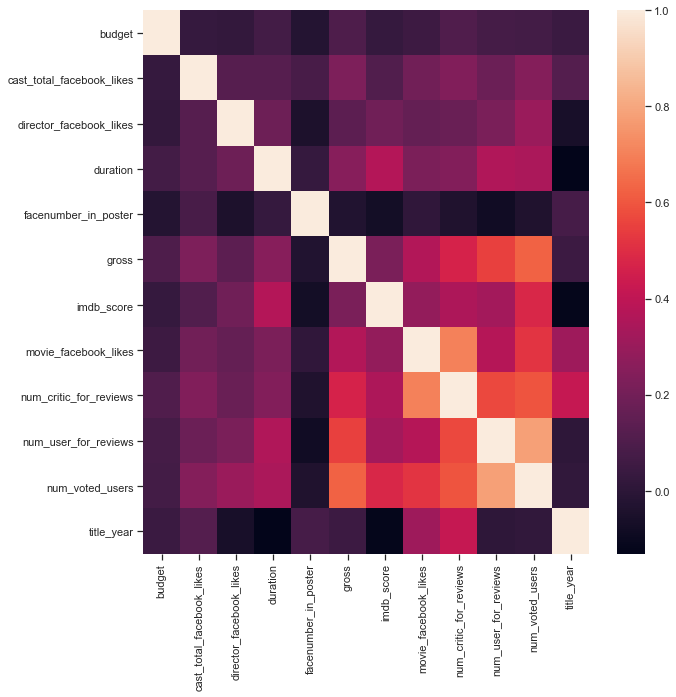

In [61]:
plt.figure(figsize=(10, 10));
sns.heatmap(df.corr());

The heatmap above can help summarize our findings.  The variables with the highest correlations to IMDB score are: num_voted_users, duration, movie_facebook_likes, and num_critic_for_reviews.  This was all indicated in the ANOVA and correlation tests we ran, but this is nice way to visualize it.

## Conclusion

- In conclusion, using the data visualizations and correlation analyses above, we have deduced the following variables are especially important to consider in predicting a movie's success:
    - Number of Users Voted
    - Duration
    - Number of Critics for Reviews
    - Facebook Likes for Movie
- The significance of the quantity of user votes and critics for reviews was initially surprising, but upon further consideration, it makes sense.  If a movie is particularly good (and therefore worthy of a higher IMDB rating), there was most likely a bigger overall audience to subsequently give reviews or cast votes.
- The significance of number of Facebook likes is sensical. As we discussed earlier, the more attention something receives, the more likely it is that someone else will learn about it and garner additional interest.  The interactions on social media spread word about what, to someone who hasn't engaged yet, could potentially be a good movie.  Facebook likes are not a form of advertisement or official promotion, but it constitutes a somewhat indirect publicity that, as we have demonstrated, yields positive effects. 

# Final Project

In this model development, I chose the variables identified prior as the independent variables to be investigated.  The variables are as follows:
- *num_voted_users*
- *duration*
- *num_critic_for_reviews*
- *movie_facebook_likes* <br/>

The goal of further analyzing these variables is to construct a model that predicts how successful a movie will be.  First, whether or not a linear relationship between *imdb_score* and the respective predictors exists will be investigated.  Next, classification models will be built and studied, using *bad*, *okay*, *good*, and *excellent* as categorical descriptors for the movies.  Finally, a clustering technique will be utilized to divide closely aggregated data points into groups with similar attributes.

## Regression

In [62]:
import sklearn.linear_model as lm
from sklearn.metrics import mean_squared_error
from sklearn.metrics import explained_variance_score

import numpy as np
from sklearn.model_selection import train_test_split

import statsmodels.api as sm
from statsmodels.formula.api import ols

In [63]:
y = df['imdb_score']
x = df[['num_critic_for_reviews', 'duration', 'movie_facebook_likes', 'num_voted_users']]

#### *Linear Regression*

In [64]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.33, random_state=42)

In [65]:
print(len(df), len(x), len(y))

3786 3786 3786


In [66]:
print(len(x_train), len(x_test), len(y_train), len(y_test))

2536 1250 2536 1250


In [67]:
model = lm.LinearRegression()
model.fit(x_train, y_train)
predicted_y = model.predict(x_test)

In [68]:
coef = ["%.5f" % i for i in model.coef_]
xcolumns = [i for i in x.columns]
list(zip(xcolumns, coef))

[('num_critic_for_reviews', '0.00092'),
 ('duration', '0.01121'),
 ('movie_facebook_likes', '-0.00000'),
 ('num_voted_users', '0.00000')]

We can observe from these results that the respective coefficients for each test independent variable is startlingly low.  We will continue toward and apply this training to the actual variables, then investigate further.

In [69]:
print("mean squared error: ", mean_squared_error(y_test, predicted_y))
print("variance or r-squared: ", explained_variance_score(y_test, predicted_y))

mean squared error:  0.8012260157210318
variance or r-squared:  0.27446562854041034


Our mean squared error calculated to 0.80123, which indicates the data values are dispersed very widely around the dataset's mean.  Lower mean squared error values are preferrable, demonstrating a smaller squared difference between estimated values and actual values.  Additionally, our r-squared value is disappointingly low - with a value  of 0.27447.  Since r-squared represents the proportion of variance for a dependent variable explained by the independent variables in the regression model, it is ideal to have a larger value. 

Let's test the full model, instead of just our subset of data.

In [70]:
model1 = lm.LinearRegression()
model1.fit(x, y)
model1_y = model1.predict(x)

In [71]:
coef = ["%.5f" % i for i in model1.coef_]
xcolumns = [i for i in x.columns]
list(zip(xcolumns, coef))

[('num_critic_for_reviews', '0.00086'),
 ('duration', '0.01058'),
 ('movie_facebook_likes', '-0.00000'),
 ('num_voted_users', '0.00000')]

In comparison with the results received from our test regression model, the coefficients for *num_critic_for_reviews* and *duration* are marginally larger.  However, for all variables, the coefficients are strikingly small.

#### *Model Evaluation*

In [72]:
print("mean squared error: ", mean_squared_error(y, model1_y))
print("variance or r-squared: ", explained_variance_score(y, model1_y))

mean squared error:  0.7984171200558091
variance or r-squared:  0.28144419851562397


In accordance with the observation made above, the calculated values for mean squared error and r-squared are marginally improved.  Using the real data, we see a smaller squared difference between the estimated values and actual values.  With a larger r-squared value, as well, we can deduce this regression model has variance better explained by the independent variables.

#### *Multiple Regression*

In [73]:
runs_reg_model = ols("imdb_score~num_voted_users+duration+num_critic_for_reviews+movie_facebook_likes", df)
runs_reg = runs_reg_model.fit()
print(runs_reg.summary())

                            OLS Regression Results                            
Dep. Variable:             imdb_score   R-squared:                       0.281
Model:                            OLS   Adj. R-squared:                  0.281
Method:                 Least Squares   F-statistic:                     370.2
Date:                Sun, 08 Dec 2019   Prob (F-statistic):          2.32e-269
Time:                        21:19:14   Log-Likelihood:                -4945.9
No. Observations:                3786   AIC:                             9902.
Df Residuals:                    3781   BIC:                             9933.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
Intercept                  4

The r square value listed in the results above (0.281) approximately the same as we found in the linear regression model.

In [74]:
print(np.linalg.cond(runs_reg.model.exog))

968293.1729202155


As indicated by the OLS regression results above, the larger value received communicates strong multicollinearity between variables.  This is a phenomenon in which one x-variable can be linearly predicted by the presence of another variable, with considerable accuracy - and this is a problem, because it undermines the statistical significance of an independent variable.

Let's try running another multiple regression with less variables.

In [75]:
runs_reg_model = ols("imdb_score~duration+movie_facebook_likes", df)
runs_reg = runs_reg_model.fit()
print(runs_reg.summary())

                            OLS Regression Results                            
Dep. Variable:             imdb_score   R-squared:                       0.179
Model:                            OLS   Adj. R-squared:                  0.178
Method:                 Least Squares   F-statistic:                     412.0
Date:                Sun, 08 Dec 2019   Prob (F-statistic):          1.29e-162
Time:                        21:19:14   Log-Likelihood:                -5198.5
No. Observations:                3786   AIC:                         1.040e+04
Df Residuals:                    3783   BIC:                         1.042e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
Intercept                4.7032 

In [76]:
print(np.linalg.cond(runs_reg.model.exog))

117738.53216202617


We still received a warning for the presence of multicollinearity, but it is worth noting this value is considerably smaller (relatively speaking) compared to the multicollinearity between the four variables tested previously.  However, it is worth noting the r square value decreased.

Even though multicollinearity is preferrable to avoid, it seems unrealistic to expect we can erase this characteristic, given the real-world complexity of the dataset.  No causal relationships exist between the variables being tested, despite perhaps being closely related to one another, so it wouldn't be productive to remove or replace them.  We can simply recognize the multicollinearity and accept it as a characteristic of the model.  However, we will use Lasso regression to attempt further simplifying the model through a process of regularization, to test whether our issue of multicollinearity can be addressed through this means.

In [77]:
runs_reg_model = ols("imdb_score~num_voted_users+movie_facebook_likes", df)
runs_reg = runs_reg_model.fit()
print(runs_reg.summary())

                            OLS Regression Results                            
Dep. Variable:             imdb_score   R-squared:                       0.232
Model:                            OLS   Adj. R-squared:                  0.232
Method:                 Least Squares   F-statistic:                     571.8
Date:                Sun, 08 Dec 2019   Prob (F-statistic):          1.07e-217
Time:                        21:19:14   Log-Likelihood:                -5071.6
No. Observations:                3786   AIC:                         1.015e+04
Df Residuals:                    3783   BIC:                         1.017e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
Intercept                6.1040 

#### *Lasso*

**Lasso** is a regression model that includes regularization, or a mechanism of considering fewer prediction models.  Therefore, it is a simpler regression model by finding the model solution with fewer independent variables.

In [78]:
model1 = lm.Lasso()
model1.fit(x, y)
model1_y = model.predict(x)
model1

Lasso(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=1000,
      normalize=False, positive=False, precompute=False, random_state=None,
      selection='cyclic', tol=0.0001, warm_start=False)

In [79]:
coef = ["%.5f" % i for i in model1.coef_]
xcolumns = [i for i in x.columns]
list(zip(xcolumns, coef))

[('num_critic_for_reviews', '0.00072'),
 ('duration', '0.00832'),
 ('movie_facebook_likes', '-0.00000'),
 ('num_voted_users', '0.00000')]

In comparison with the results received from our test regression model, the coefficient for *duration* are marginally larger.  However, for all variables, the coefficients are strikingly small.  Our analysis thus far suggests this is not a good model.

In [80]:
model2 = lm.LinearRegression()
model2.fit(x, y)
model2_y = model2.predict(x)

print("mean square error: ", mean_squared_error(y, model2_y))
print("variance or r-squared: ", explained_variance_score(y, model2_y))

mean square error:  0.7984171200558091
variance or r-squared:  0.28144419851562397


The Lasso regression yielded results no different from those previously received.  Therefore, we will pursue other models.

#### *Recursive Feature Selection*

In [81]:
from sklearn.feature_selection import RFE

In [82]:
lr = lm.LinearRegression()
rfe = RFE(lr, n_features_to_select=2)
rfe_y = rfe.fit(x,y)

print("features sorted by rank: ")
print(sorted(zip([x for x in rfe.ranking_], x.columns)))

features sorted by rank: 
[(1, 'duration'), (1, 'num_critic_for_reviews'), (2, 'num_voted_users'), (3, 'movie_facebook_likes')]


According to the recursive feature selection model, *duration* and *num_critic_for_reviews*, are the most significant in predicting a movie's IMDB score.  This was implied in our earlier observations, because these two variables had the largest coeffients during our linear regression modeling.  

In [83]:
runs_reg_model = ols("imdb_score~duration+num_critic_for_reviews", df)
runs_reg = runs_reg_model.fit()
print(runs_reg.summary())

                            OLS Regression Results                            
Dep. Variable:             imdb_score   R-squared:                       0.209
Model:                            OLS   Adj. R-squared:                  0.208
Method:                 Least Squares   F-statistic:                     499.5
Date:                Sun, 08 Dec 2019   Prob (F-statistic):          3.09e-193
Time:                        21:19:14   Log-Likelihood:                -5128.0
No. Observations:                3786   AIC:                         1.026e+04
Df Residuals:                    3783   BIC:                         1.028e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
Intercept                  4

Although the results don't look particularly appealing on this surface, this model more accurately represents the relationship between our variables, compared to the previous models we've analyzed.  The r square value is marginally lower than our multiple regression model with all four variables, and the multicollinearity result is substantially lower.

#### *RandomForestRegressor*

In [84]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression

y = df['imdb_score']
x = df[['num_critic_for_reviews', 'duration', 'movie_facebook_likes', 'num_voted_users']]

regr = RandomForestRegressor(n_estimators=100, random_state=0)
regr.fit(x, y)
regr_predicted = regr.predict(x)

print("mean square error: ", mean_squared_error(y, regr_predicted))
print("r squared: ", explained_variance_score(y, regr_predicted))

mean square error:  0.10789063417855259
r squared:  0.9029701058305628


In [85]:
sorted(zip(regr.feature_importances_, x.columns))

[(0.11625858558251446, 'movie_facebook_likes'),
 (0.2037265378837893, 'duration'),
 (0.2056645837361206, 'num_critic_for_reviews'),
 (0.47435029279757573, 'num_voted_users')]

In [86]:
y = df['imdb_score']
x = df[['num_critic_for_reviews', 'num_voted_users']]

regr = RandomForestRegressor(n_estimators=100, random_state=0)
regr.fit(x, y)
regr_predicted = regr.predict(x)

print("mean square error: ", mean_squared_error(y, regr_predicted))
print("r squared: ", explained_variance_score(y, regr_predicted))

mean square error:  0.128272586634971
r squared:  0.8845834644168357


These are the kind of results we are hoping for!  The mean square error, with a value of 0.12878, indicates our data values are dispersed closely to the dataset's mean.  Additionally, r-squared is 0.88458, which is outstanding compared to the low values we were receiving earlier.  This tells us 88.458 percent of variance in the *imdb_score* can be explained by *num_critic_for_reviews* and *num_voted_users*.

Therefore, **we choose RandomForestRegressor as our regression model**.

## Classification

In [87]:
from sklearn import tree
from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
import statsmodels.api as sm
from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_regression

In [88]:
df['imdb_label'] = pd.cut(x=df['imdb_score'], bins=[0, 4, 6, 8, 10], labels=['Bad', 'Okay', 'Good', 'Excellent'])

In [89]:
df = pd.get_dummies(df, columns=['imdb_label'], prefix=['label'])
df.head(2)

,budget,cast_total_facebook_likes,content_rating,country,director_facebook_likes,director_name,duration,facenumber_in_poster,genres,gross,...,movie_title,num_critic_for_reviews,num_user_for_reviews,num_voted_users,plot_keywords,title_year,label_Bad,label_Okay,label_Good,label_Excellent
0,237000000.0,4834,PG-13,USA,0,James Cameron,178.0,0,Action|Adventure|Fantasy|Sci-Fi,760505847.0,...,Avatar,723,3054,886204,avatar|future|marine|native|paraplegic,2009,0,0,1,0
1,300000000.0,48350,PG-13,USA,563,Gore Verbinski,169.0,0,Action|Adventure|Fantasy,309404152.0,...,Pirates of the Caribbean: At World's End,302,1238,471220,goddess|marriage ceremony|marriage proposal|pi...,2007,0,0,1,0


In [90]:
y = df[['label_Bad', 'label_Okay', 'label_Good', 'label_Excellent']]
x = df[['num_critic_for_reviews', 'duration', 'movie_facebook_likes', 'num_voted_users']]

print(y.shape, x.shape)

(3786, 4) (3786, 4)


#### *DecisionTreeRegressor*

**Decision Trees** are an intuitive way of selecting which independent variables are most significant.  

In [91]:
x_train, x_test, y_train, y_test = train_test_split(x, y, random_state=42)
dt = DecisionTreeRegressor()
dt = dt.fit(x_train, y_train)
dt

DecisionTreeRegressor(criterion='mse', max_depth=None, max_features=None,
                      max_leaf_nodes=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      presort=False, random_state=None, splitter='best')

In [92]:
print(metrics.accuracy_score(y_test, dt.predict(x_test)))
print("--------------------------------------------------------")
print(metrics.classification_report(y_test, dt.predict(x_test)))
print("--------------------------------------------------------")
print(metrics.roc_auc_score(y_test, dt.predict(x_test)))

0.6019007391763463
--------------------------------------------------------
              precision    recall  f1-score   support

           0       0.12      0.14      0.13        22
           1       0.42      0.42      0.42       273
           2       0.71      0.71      0.71       609
           3       0.49      0.44      0.46        43

   micro avg       0.60      0.60      0.60       947
   macro avg       0.44      0.43      0.43       947
weighted avg       0.60      0.60      0.60       947
 samples avg       0.60      0.60      0.60       947

--------------------------------------------------------
0.61300623964395


From the results above, our *DecisionTreeRegressor* model is 60.190 percent accurate.  This does not sound particularly good, but given the complexity and size of our original dataset, I consider this an impressive result.  However, we will continue using more classification models and comparing them to determine the best one.  

Before moving on, however, an important observation is to be made:
- This model has an incredibly unreliable ability to *not label a negative sample as positive*.  For example, the model is only 13 percent precise when not labeling a bad movie as anything else.
- Additionally, this model has a similarly unreliable ability to *find all positive samples*.  For example, the model is only 14 percent precise when identifying movies labelled as bad.

In [93]:
from sklearn.tree import export_graphviz
from graphviz import Source

Source(export_graphviz(dt, out_file=None, feature_names=x.columns))

#### *Feature Selection* - *ExtraTreesClassifier*

In [94]:
from sklearn.ensemble import ExtraTreesClassifier

In [95]:
model_extra = ExtraTreesClassifier()
model_extra.fit(x, y)

ExtraTreesClassifier(bootstrap=False, class_weight=None, criterion='gini',
                     max_depth=None, max_features='auto', max_leaf_nodes=None,
                     min_impurity_decrease=0.0, min_impurity_split=None,
                     min_samples_leaf=1, min_samples_split=2,
                     min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=None,
                     oob_score=False, random_state=None, verbose=0,
                     warm_start=False)

In [96]:
print((model_extra.feature_importances_))

[0.25707758 0.24999414 0.16007374 0.33285455]


In [97]:
print("features sorted by rank: ")
print(sorted(zip([round(x, 5) for x in model_extra.feature_importances_], x.columns)))

features sorted by rank: 
[(0.16007, 'movie_facebook_likes'), (0.24999, 'duration'), (0.25708, 'num_critic_for_reviews'), (0.33285, 'num_voted_users')]


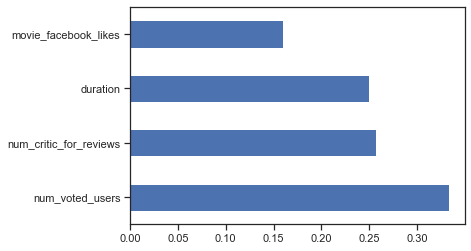

In [98]:
pd.DataFrame(model_extra.feature_importances_, index = x.columns,
                                    columns=['importance']).sort_values('importance', ascending=False).plot(kind='barh', 
                                                                                                            legend=None);

This classification model indicates the most important variable is *num_voted_users* and an almost equal importance between *duration* and *num_critic_for_reviews*.  This supports conclusions we reached during our regression analysis.

#### *Feature Selection - SelectKBest*

In [99]:
from sklearn.feature_selection import chi2

x_new = SelectKBest(chi2, k=3).fit_transform(x, y)
print(x_new)

[[7.23000e+02 3.30000e+04 8.86204e+05]
 [3.02000e+02 0.00000e+00 4.71220e+05]
 [6.02000e+02 8.50000e+04 2.75868e+05]
 ...
 [5.60000e+01 0.00000e+00 5.20550e+04]
 [1.40000e+01 4.13000e+02 1.33800e+03]
 [4.30000e+01 4.56000e+02 4.28500e+03]]


In [100]:
selector = SelectKBest(chi2, k=2).fit(x, y)
idxs_selected = selector.get_support(indices=True)
print(idxs_selected)

[2 3]


In [101]:
x.head(1)

,num_critic_for_reviews,duration,movie_facebook_likes,num_voted_users
0,723,178.0,33000,886204


*movie_facebook_likes* and *num_voted_users* are selected as the two best predictors.

#### *Cross Validation*

In [102]:
from sklearn.model_selection import cross_val_score

In [103]:
cv = cross_val_score(DecisionTreeClassifier(), x, y, scoring='accuracy', cv=10)
print(cv)
print(cv.mean())

[0.71240106 0.63588391 0.63588391 0.66226913 0.5883905  0.60158311
 0.65873016 0.61111111 0.4973545  0.49470899]
0.6098316371403443


In [104]:
print("Accuracy: %0.5f (+/- %0.2f)" % (cv.mean(), cv.std() * 2))

Accuracy: 0.60983 (+/- 0.13)


This classification model has accuracy identical to that of the decision tree model, at approximately 61.247 percent.  Although we already that this is not a particularly impressive measure, it should be considered relevant that both models produced the same result for accuracy.

## Clustering

**Clustering** is a form of unsupervised learning that groups datapoints that are spatially close to one another.  

In [105]:
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import pairwise_distances

In [106]:
y = df[['label_Bad', 'label_Okay', 'label_Good', 'label_Excellent']]
x = df[['num_critic_for_reviews', 'duration', 'movie_facebook_likes', 'num_voted_users']]

#### *Normalization*

In [107]:
x_norm = (x - x.mean()) / (x.max() - x.min())
x_norm.head()

,num_critic_for_reviews,duration,movie_facebook_likes,num_voted_users
0,0.686465,0.232309,0.068101,0.463116
1,0.168630,0.201592,-0.026454,0.217526
2,0.537633,0.129920,0.217099,0.101915
3,0.797166,0.184528,0.443460,0.615881
5,0.365432,0.075312,0.042313,0.064238


#### *K-Means Clustering*

In [108]:
k_means = KMeans(init="k-means++", n_clusters=4, random_state=0)
k_means.fit(x_norm)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=4, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=0, tol=0.0001, verbose=0)

In [109]:
k_means.labels_

array([1, 3, 1, ..., 2, 2, 2])

In [110]:
k_means.cluster_centers_

array([[ 2.75171612e-02,  2.37591977e-04, -8.69828951e-03,
        -1.31837934e-03],
       [ 4.34155252e-01,  8.32760899e-02,  2.03625411e-01,
         2.45620258e-01],
       [-1.15444358e-01, -1.73314832e-02, -2.39388013e-02,
        -4.38192563e-02],
       [ 2.04814385e-01,  3.54860615e-02,  4.77724947e-02,
         8.52004165e-02]])

In [111]:
df1 = pd.DataFrame(k_means.labels_, columns = ['cluster'])

In [112]:
df2 = x_norm.join(df1)
df2.head()

,num_critic_for_reviews,duration,movie_facebook_likes,num_voted_users,cluster
0,0.686465,0.232309,0.068101,0.463116,1.0
1,0.168630,0.201592,-0.026454,0.217526,3.0
2,0.537633,0.129920,0.217099,0.101915,1.0
3,0.797166,0.184528,0.443460,0.615881,1.0
5,0.365432,0.075312,0.042313,0.064238,3.0


##### *Profiling Clusters*

In [113]:
k_means = KMeans(init="k-means++", n_clusters=4, random_state=0)
k_means.fit(x)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=4, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=0, tol=0.0001, verbose=0)

In [114]:
df3 = pd.DataFrame(k_means.labels_, columns = ['cluster'])

In [115]:
df4 = x_norm.join(df3)
df4.head()

,num_critic_for_reviews,duration,movie_facebook_likes,num_voted_users,cluster
0,0.686465,0.232309,0.068101,0.463116,1.0
1,0.168630,0.201592,-0.026454,0.217526,3.0
2,0.537633,0.129920,0.217099,0.101915,0.0
3,0.797166,0.184528,0.443460,0.615881,1.0
5,0.365432,0.075312,0.042313,0.064238,3.0


In [116]:
df4.groupby(['cluster']).mean()

,num_critic_for_reviews,duration,movie_facebook_likes,num_voted_users
cluster,,,,
0.0,0.039874,0.017470,0.012310,0.022944
1.0,0.084989,0.038841,0.016905,0.063073
2.0,-0.009459,-0.000022,-0.003747,-0.004619
3.0,0.092599,0.023082,0.025663,0.044105


 - **Cluster 0** is characterized by a medium number of critics for review; medium duration; medium-low number of Facebook likes; and relatively low number of user votes
     - This can be assumed to represent the "okay" category of movies
 - **Cluster 1** is characterized by a high number of critics for review; high duration; high number of Facebook likes; and high number of user votes
     - This can be assumed to represent the "excellent" category of movies
 - **Cluster 2** is characterized by a low number of critics for review; low duration; low number of Facebook likes; and low number of user votes
     - This can be assumed to represent the "bad" category of movies
 - **Cluster 3** is characterized by a high number of critics for review; medium duration; medium number of Facebook likes; and medium number of user votes
     - This can be assumed to represent the "good" number of movies

In [117]:
df4.groupby(['cluster']).count()

,num_critic_for_reviews,duration,movie_facebook_likes,num_voted_users
cluster,,,,
0.0,690,690,690,690
1.0,51,51,51,51
2.0,2264,2264,2264,2264
3.0,224,224,224,224


The largest cluster, by a considerable amount, is **cluster 2** - which is characterized by a low number of critics for review; low duration; low number of Facebook likes; and low number of user votes

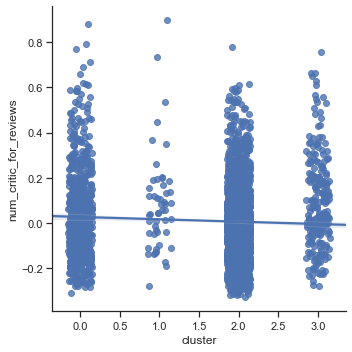

In [118]:
sns.lmplot('cluster', 'num_critic_for_reviews', df4, x_jitter=.15, y_jitter=.15);

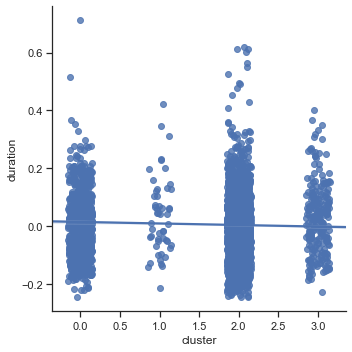

In [119]:
sns.lmplot('cluster', 'duration', df4, x_jitter=.15, y_jitter=.15);

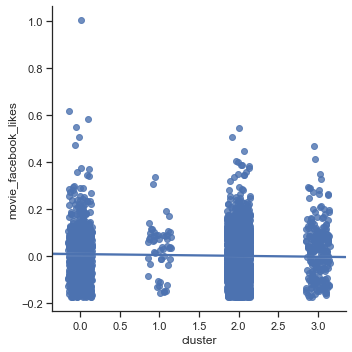

In [120]:
sns.lmplot('cluster', 'movie_facebook_likes', df4, x_jitter=.15, y_jitter=.15);

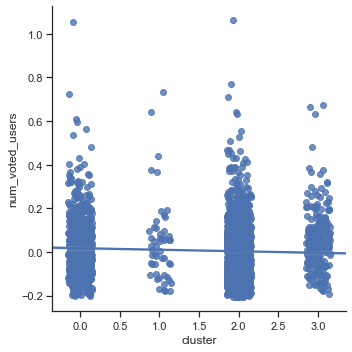

In [121]:
sns.lmplot('cluster', 'num_voted_users', df4, x_jitter=.15, y_jitter=.15);

#### *Decision Tree*

In [122]:
df2 = df2.dropna()
df2.astype('int32').dtypes

num_critic_for_reviews    int32
duration                  int32
movie_facebook_likes      int32
num_voted_users           int32
cluster                   int32
dtype: object

In [123]:
y = df2['cluster']
x = df2.drop(['cluster'], axis=1)

In [124]:
from sklearn.tree import DecisionTreeClassifier
from sklearn import metrics

In [125]:
dt = DecisionTreeClassifier()
dt = dt.fit(x, y)
dt.score(x, y)

0.9996903065964695

In [126]:
print(metrics.accuracy_score(y, dt.predict(x)))
print('-------------------------------------------------------')
print(metrics.confusion_matrix(y, dt.predict(x)))
print('-------------------------------------------------------')
print(metrics.classification_report(y, dt.predict(x)))

0.9996903065964695
-------------------------------------------------------
[[1123    0    0    0]
 [   0  125    0    0]
 [   1    0 1508    0]
 [   0    0    0  472]]
-------------------------------------------------------
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1123
         1.0       1.00      1.00      1.00       125
         2.0       1.00      1.00      1.00      1509
         3.0       1.00      1.00      1.00       472

    accuracy                           1.00      3229
   macro avg       1.00      1.00      1.00      3229
weighted avg       1.00      1.00      1.00      3229



In [127]:
predicted_y = dt.predict(x)
print(predicted_y)

[1. 3. 1. ... 2. 2. 2.]


In [128]:
Source(export_graphviz(dt, out_file=None, feature_names=x.columns))

In [129]:
from sklearn.ensemble import RandomForestClassifier

clf = RandomForestClassifier(n_estimators=20)
clf=clf.fit(x, y)
clf.score(x,y)

0.9928770517187984

In [130]:
pd.DataFrame({'feature':x.columns, 'importance':clf.feature_importances_})

,feature,importance
0,num_critic_for_reviews,0.290711
1,duration,0.232931
2,movie_facebook_likes,0.147186
3,num_voted_users,0.329172


This reinforces some observations we made earlier, that *num_critic_for_reviews* is (comparatively) a strongly important feature, followed by *duration*, in assigning groups of movies with similar characteristics.

## Storytelling

In this final segment of our investigation about predicting a movie's success, we took the information gathered in the first segment - data visualization, business intelligence and correlation analysis - and applied a series of machine learning algorithms to build models capable of producing accurate predictions.  We used regression, classification and clustering techiniques during our analysis of the dataset.

- Regression to predict continuous output (i.e., the IMDB score)
- Classification to predict discrete output (i.e., whether is a movie is bad, okay, good, or excellent)
- Clustering to partition the dataset into groups based on similarity

The variables we focused on during this segment were previously identified as having a relatively strong correlation to our independent variable (*imdb_score*): *num_voted_users*, *duration*, *num_critic_for_reviews*, and *movie_facebook_likes*. 

#### Discoveries from Regression

Our regression analyses yielded relatively disappointing results in terms of finding a model to reliably and accurately predict movie success.  The mean squared errors we received were considerably high, indicating high dispersal around the dataset's mean and therefore a large difference between estimated and actual values, and the r square values were strikingly low.  Since this value represents the proportion of variance as explained by independent variables, it is far from preferrable to receive  such low values, like 0.27447 and 0.28144 in the linear regression models.  

Using multiple regression analysis, the results were effectively the same, when running against all four independent variables, and even decreased when reducing the independent variables to two.  Additionally, it is important to note the presence of strong multicollinearity was present in these models.  Although this is a characteristic we should generally avoid, it seems unrealistic to expect complete erasure of it, given the size and complexity of the dataset.  It does not appear as if any causal relationships exist between the variables, so it is not in our interest to attempt removing or replacing them to address the issue of multicollinearity.  It is simply something we accept as a feature of the model.  

When looking at feature selection models, **we determined the most important independent variable was *num_voted_users* in the regression model.**  The importance between *num_critic_for_reviews* and *duration* was effectively the same.  **When running *num_voted_users* and *num_critics_for reviews* through the RandomForestRegressor, we received an outstanding mean square error of 0.12878 and an r square of 0.88458.**  These are the kind of results we were looking for, and therefore we accepted the RandomForestRegressor as our final model.  

#### Discoveries from Classification

During our classification analysis, we separated the discrete values of *imdb_score* into four categories: bad, okay, good, and excellent.  Feature selection classification models, which will be discussed later, yielded the most favorable results, but the decision trees we generated during this part of the investigation were less than ideal.  

Using a DecisionTreeRegressor, we found the model to be 60.190 percent accurate.  It is worth mentioning, however, that given the size and complexity of the dataset, I considered this a surprisingly impressive accuracy.  The issue was found in the model's precision and recall scores: the DecisionTreeRegressor had only 13 percent precision when not inaccurately labelling bad movies and only a 14 percent precision when identifying movies lablled as bad.  It was significantly more accurate when considering good movies (both 71 percent accurate in terms of precision and recall), but this demonstrates an extreme disparity between ability to handle certain variables and we considered it highly unreliable. 

The ExtraTreesClassifier feature selection model gave us insight into which variables were most significant when predicting which category a movie would fall into.  It told us that ***num_voted_users* was considerably the most important predictor, with a marginal difference between the importance ofo *num_critic_for_reviews* and *duration***.  These results supported insights we made during our regression analyses and therefore were very encouraging to see.  



#### Discoveries from Clustering

In our final investigation, clustering, we created four clusters to segregate groups of data demonstrating similar traits:

 - Cluster 0 was characterized by a medium number of critics for review; medium duration; medium-low number of Facebook likes; and relatively low number of user votes
 - Cluster 1 was  characterized by a high number of critics for review; high duration; high number of Facebook likes; and high number of user votes
 - Cluster 2 was characterized by a low number of critics for review; low duration; low number of Facebook likes; and low number of user votes
 - Cluster 3 was characterized by a high number of critics for review; medium duration; medium number of Facebook likes; and medium number of user votes

With 2264 observations in cluster 2, and the next largest cluster being cluster 0 with only 690 observations, it is by far the largest.  This means, **most movies in our dataset could be described as having a low number of critics for review, low duration, low number of Facebook likes, and low number of user votes**.  This can be interpreted to mean most movies in the dataset would be described as "bad" movies.  A DecisionTreeClassifier reinforced the results of this analysis by telling us the model is 99.970 percent accurate.  Therefore, we accept the model.  

#### Closing Thoughts

From the results gathered in our initial investigation, using a variety of business intelligence, data visualization and correlation analysis, we determined that four variables seemed most significant when determining the score a movie receives: *num_voted_users*, *duration*, *num_critic_for_reviews*, and *movie_facebook_likes*.  Using machine learning techniques such as regression, classification and clustering, we tested the ability of these variables to predict new data, if these models would be appropriate to employ for evaluating future movie success, rather than making observations about existing data. 

Evidence pointed toward *num_critic_for_reviews* as being the single most important variable in all models constructed and validated.  The significance held by *duration* and *num_voted_users* were effectively identical, and they trailed closely with the second most significance.  Even though our initial analysis concluded *movie_facebook_likes* had correlation with a movie's *imdb_score*, the results seen during this segment seemed to indicate little practicality in employing in actual models.


It is important to recognize each model's shortcomings and be straightforward that even those with highest accuracy were not, in fact, impressive at their ability to accurately predict new data.  So much goes into a movie's reception that can't be captured effectively a dataset - people's personal preferences, what necessarily motivates people to review or vote, etc. - and this makes prediction difficult to achieve.

### Rebecca Jenkins
On my honor, as a student, I have neither given nor received unauthorized aid on this academic work.